In [39]:
import numpy as np
import numpy.ma as ma
import re
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.animation import ArtistAnimation, FFMpegWriter
import matplotlib.cm as cm
import cartopy.crs as ccrs
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
from cartopy.feature import COASTLINE, LAND

bad_value = -999 
num_cols = 1440
num_rows = 720

# Function definitions

This section contains the functions used for preprocessing the data. They are as follows -

1. bin_segregator - this function counts the number of values falling into each of bins described. This is a helper function which we used to determine which bins to use for the continuous plot.

2. read_dataset - this function is used to process the data. It works as follows - it takes the scalar field values for each longitude and latitude. For the longitudes for which we do not have data, we put the bad value -999. Along with that, we also keep track of the max no of values which we have a value for all latitudes. Both these variables are returned.

3. load_data - this function takes the list of files to read from, and returns the overall number of longitudes allowed, by taking the min across all datasets, and returns the datasets along with this max values.

4. get_longitudes - this function, given a number, can calculate the max longitude starting from 0. This allows us to get to know the extent of the map from the length value that we have from load_data.

Using these values, we then call appropriate plotting functions.

In [40]:
def bin_segregator(rain, bins):
    counts = {}
    for i in range(0,len(bins)-1):
        counts[bins[i]] = np.count_nonzero(np.logical_and(rain>bins[i], rain<=bins[i+1]))
    return counts

In [41]:
def read_dataset(name):

    max_length = 1440

    f = open(name)
    lines = f.readlines()
    lines = lines[7:]

    splitted_dict = {}

    for i in lines:
        i = i.strip()
        line = re.split(r'[\t\n]',i)
        if (line[-1].find("** line too long **") != -1) or (line[-1] == "** line too long **"):
            line.pop() 
        
        temp = []
        for j in range(1, len(line)):
            temp.append(float(line[j]))
            
        splitted_dict[line[0]] = temp
    
    rain = []
    for i in splitted_dict.keys():

        length = len(splitted_dict[i])
        if (length < max_length):
            max_length = length
    
    for i in splitted_dict.keys():
        temp = []
        j = 0
        while (j<len(splitted_dict[i])):
            temp.append(splitted_dict[i][j])
            j+=1
        while (j<1440):
            temp.append(bad_value)
            j+=1
        rain.append(temp)

    rain = np.array(rain)
    return rain, max_length

In [42]:
def load_data(strings):

    datasets = []
    min_length = 1440

    for i in strings:
        data, length = read_dataset(i)
        if (length < min_length):
            min_length = length
        
        datasets.append(data)
    
    return datasets,min_length

In [43]:
def get_longitudes(num):
    start = 0.125

    i=0
    longs = []
    while (i<num):
        longs.append(start)
        i+=1
        start+=0.25
    
    return longs

In [44]:
strings = ["./dataset/1_May_2015.txt","./dataset/11_May_2015.txt","./dataset/21_May_2015.txt","./dataset/1_Jun_2015.txt","./dataset/11_Jun_2015.txt",
           "./dataset/21_Jun_2015.txt","./dataset/1_Jul_2015.txt","./dataset/11_Jul_2015.txt","./dataset/21_Jul_2015.txt"]

bins = [0,0.02,0.04,0.06,0.08,0.1,0.12,0.16,0.22,0.29,1,2,25]

datasets,min_length = load_data(strings)
extent = get_longitudes(num_cols)[min_length]

print(extent)

249.375


## Observations

1. We have data till 249.375 longitude, which we will use as the extent of the plots.

2. Using the scale from the INCOIS website, we keep the bins as - [0,0.02,0.04,0.06,0.08,0.1,0.12,0.16,0.22,0.29,1,2,25].


# Plotting functions and scale experimentation

We now define the functions for plotting images. They are the following - 

1. get_color_plot_discrete - this takes one dataset, a colormap, the extent, the "ending color" and the scale (bins) as arguments, and outputs a plot with a discrete colormap. There is very less data beyond the value 2 in all the datasets. These values are outliers. Hence we choose to represent it with a completely new color in the discrete plots. This is the ending color. This color is assigned by us, and not a part of the colormap used.

2. get_color_plot_continuous - this takes one dataset, a colormap, the extent, vmin and vmax (min and max values in the dataset) as arguments, and outputs a plot with a continuous colormap. Based on the bins, we chose vmin to be 0, and vmax = 2. The values beyond vmax are plotted with the same color as vmax. We observe that this does not suffice with our requirements and the nature of the data, as many values are quite close to 0, and hence this colormap is inferior compared to the discrete one, where we can select custom ranges.

3. get_color_plot_logarithmic - this takes one dataset, a colormap, and the extent as arguments, and outputs a plot with a logarithmic colormap. For the logarithmic colormap, an offset has been added to all values, to handle the fact that logarithm for 0 is not defined. Following this, the values are plotted. Here, we observe that the scale of the values is not very apparent. Also, as it is non linear, and the values are very close to each other, hence distinguishing the values becomes difficult. Hence we use the discrete colormap.


The Viridis colormap has been used for these, along with masking of the bad values.

In [45]:
def get_color_plot_discrete(rain, colormap, extent, end, scale):

    fig = plt.figure(figsize=(20, 15))
    ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree(central_longitude=180))

    cax = fig.add_axes([0,0,0.1,0.1])
    norm = mcolors.BoundaryNorm(scale, len(scale)-1)

    cmap = mpl.colormaps[colormap].resampled(len(scale)-2)
    colors = cmap(np.linspace(0,1,len(scale)-2))
    colors = np.append(colors, end, axis=0)
    cmap = mcolors.ListedColormap(colors)

    rain_masked = ma.masked_where(rain == bad_value, rain)
    im = ax.imshow(rain_masked, cmap=cmap, extent=(-180, 180, -90, 90), origin='lower', transform=ccrs.PlateCarree(central_longitude=180), norm=norm, animated=True)

    posn = ax.get_position()
    cax.set_position([posn.x0 + posn.width + 0.01, posn.y0, 0.02, posn.height])
    
    cbar = plt.colorbar(im, cax=cax, orientation='vertical', shrink=0.6)    
    cbar.set_label('Rain')
    
    ax.add_feature(COASTLINE, linewidth=0.5, edgecolor='black')
    ax.add_feature(LAND,facecolor='lightyellow')

    ax.gridlines(draw_labels=True)
    ax.gridlines(xlocs=range(-180, 181, 30), ylocs=range(-90, 91, 30), linestyle='--', color='k')
    ax.xaxis.set_major_formatter(LONGITUDE_FORMATTER)
    ax.yaxis.set_major_formatter(LATITUDE_FORMATTER)
    ax.set_extent([0,extent,-90,90], ccrs.PlateCarree())

    plt.savefig("./images/"+colormap+'_discrete.png', bbox_inches='tight')

In [46]:
def get_color_plot_logarithmic(rain, colormap, extent):

    fig = plt.figure(figsize=(20, 15))
    ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree(central_longitude=180))

    cax = fig.add_axes([0,0,0.1,0.1])
    norm = mcolors.LogNorm()
    offset = 1e-10
    mask = (rain == bad_value)
    rain_masked = np.ma.masked_array(np.where(mask, 0, rain + offset), mask)

    im = ax.imshow(rain_masked, cmap=colormap, extent=(-180, 180, -90, 90), origin='lower', transform=ccrs.PlateCarree(central_longitude=180), norm=norm, animated=True, interpolation='bilinear')

    posn = ax.get_position()
    cax.set_position([posn.x0 + posn.width + 0.01, posn.y0, 0.02, posn.height])
    
    cbar = plt.colorbar(im, cax=cax, orientation='vertical', shrink=0.6)    
    cbar.set_label('Rain')
    
    ax.add_feature(COASTLINE, linewidth=0.5, edgecolor='black')
    ax.add_feature(LAND,facecolor='lightyellow')

    ax.gridlines(draw_labels=True)
    ax.gridlines(xlocs=range(-180, 181, 30), ylocs=range(-90, 91, 30), linestyle='--', color='k')
    ax.xaxis.set_major_formatter(LONGITUDE_FORMATTER)
    ax.yaxis.set_major_formatter(LATITUDE_FORMATTER)
    ax.set_extent([0,extent,-90,90], ccrs.PlateCarree())

    plt.savefig("./images/"+colormap+'_logarithmic.png', bbox_inches='tight')

In [47]:
def get_color_plot_continuous(rain, colormap, extent, vmin, vmax):

    fig = plt.figure(figsize=(20, 15))
    ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree(central_longitude=180))
    cax = fig.add_axes([0,0,0.1,0.1])

    rain_masked = ma.masked_where(rain == bad_value, rain)
    im = ax.imshow(rain_masked, cmap=colormap, extent=(-180, 180, -90, 90), origin='lower', transform=ccrs.PlateCarree(central_longitude=180), animated=True, vmin=vmin, vmax=vmax)

    posn = ax.get_position()
    cax.set_position([posn.x0 + posn.width + 0.01, posn.y0, 0.02, posn.height])
    
    cbar = plt.colorbar(im, cax=cax, orientation='vertical', shrink=0.6)    
    cbar.set_label('Rain')
    
    ax.add_feature(COASTLINE, linewidth=0.5, edgecolor='black')
    ax.add_feature(LAND,facecolor='lightyellow')

    ax.gridlines(draw_labels=True)
    ax.gridlines(xlocs=range(-180, 181, 30), ylocs=range(-90, 91, 30), linestyle='--', color='k')
    ax.xaxis.set_major_formatter(LONGITUDE_FORMATTER)
    ax.yaxis.set_major_formatter(LATITUDE_FORMATTER)
    ax.set_extent([0,extent,-90,90], ccrs.PlateCarree())

    plt.savefig("./images/"+colormap+'_continuous.png', bbox_inches='tight')

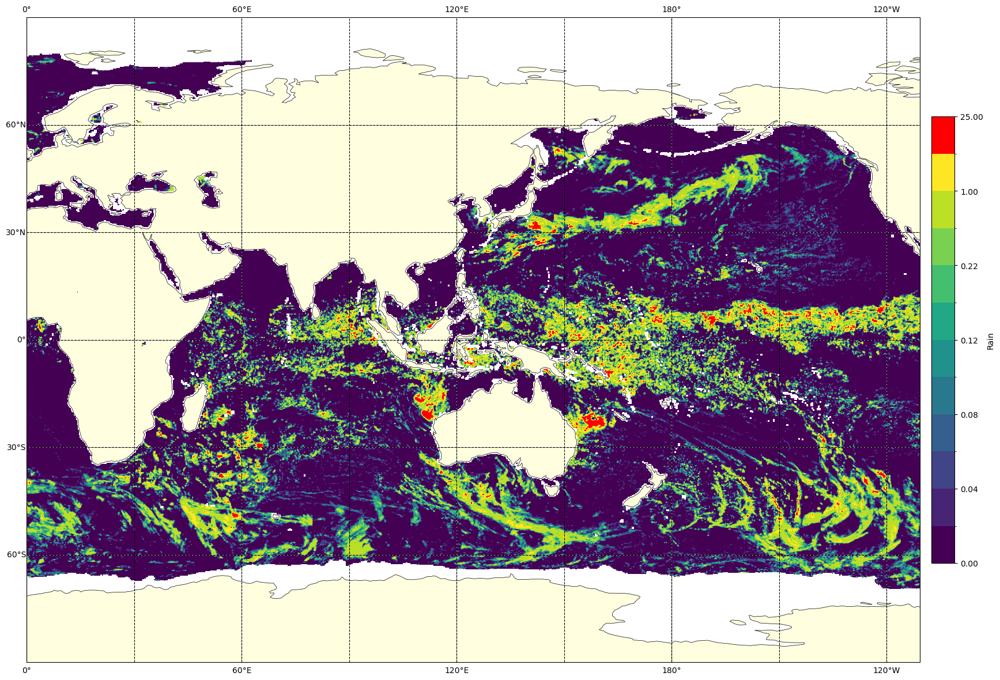

In [48]:
get_color_plot_discrete(datasets[0],'viridis',extent,np.array([[1,0,0,1]]),bins)

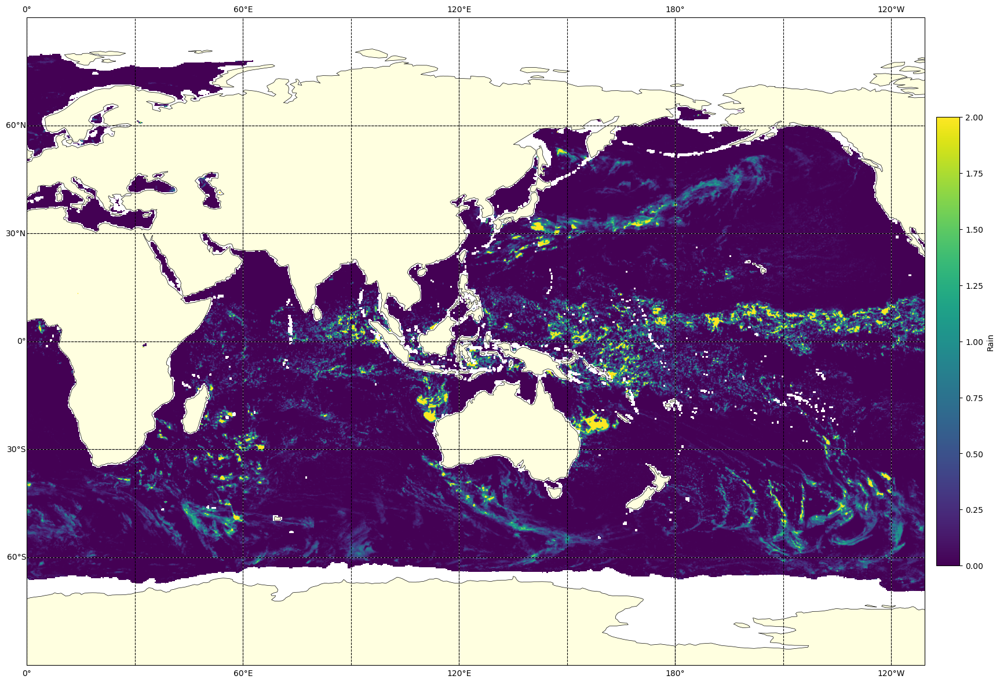

In [49]:
get_color_plot_continuous(datasets[0],'viridis',extent,0,2)

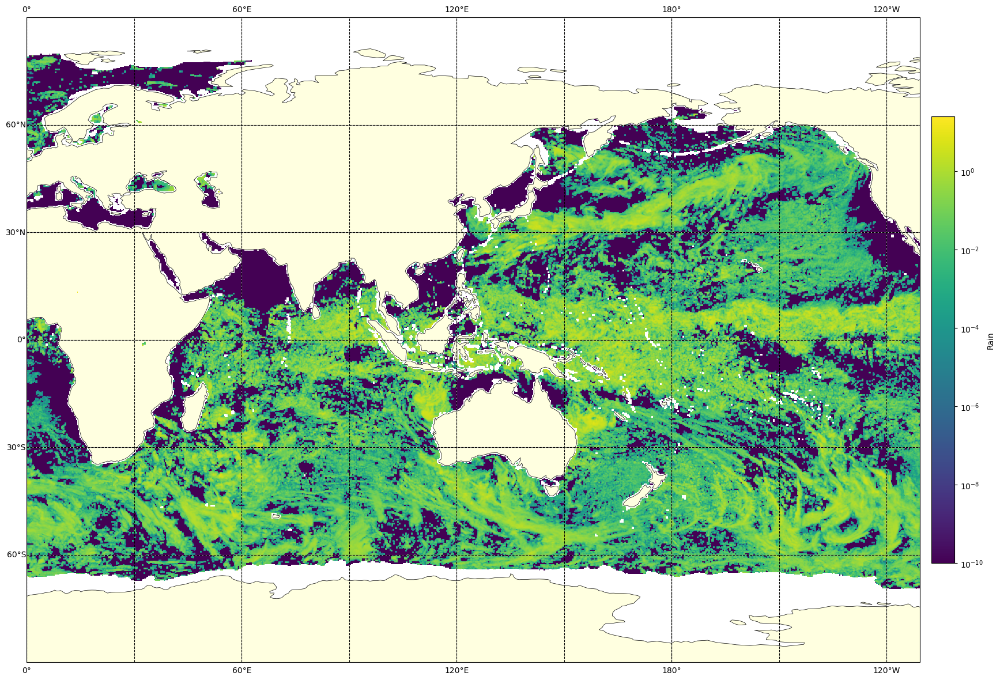

In [50]:
get_color_plot_logarithmic(datasets[0],'viridis',extent)

Based on this, we decide that the discrete colormap is best suited to our needs, and we proceed to try out different colormaps.

The colormaps we used are the following - 

1. Viridis (end outlier color - Red)
2. Plasma (end outlier color - Green)
3. Cividis (end outlier color - Red)
4. Winter (end outlier color - Yellow)

We did try out diverging colormaps as well (bwr), but felt that the diverging colormap is not suited to our need, as there is no clear defined midpoint in the data.

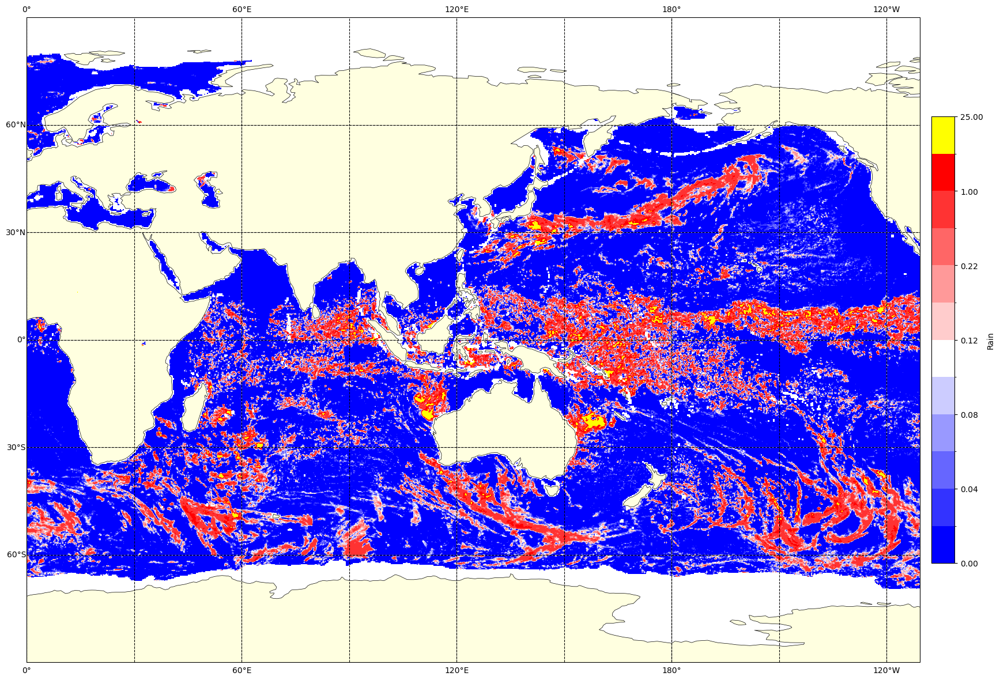

In [51]:
rain = datasets[0]
get_color_plot_discrete(rain,'bwr',extent,np.array([[1,1,0,1]]),bins)

Hence we only proceed with the discrete colormaps.

In [52]:
colormaps = ['viridis','plasma','cividis','winter']

ends = np.array([
    [[1,0,0,1]],
    [[1,0,0,1]],
    [[1,0,0,1]],
    [[0.6,0.5,0,1]]
])

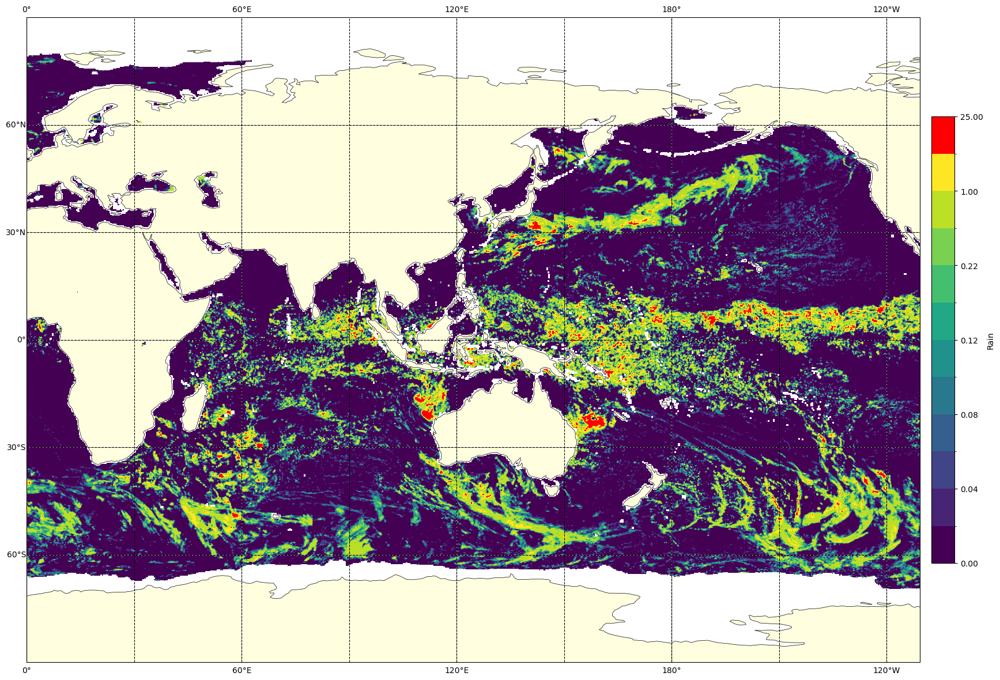

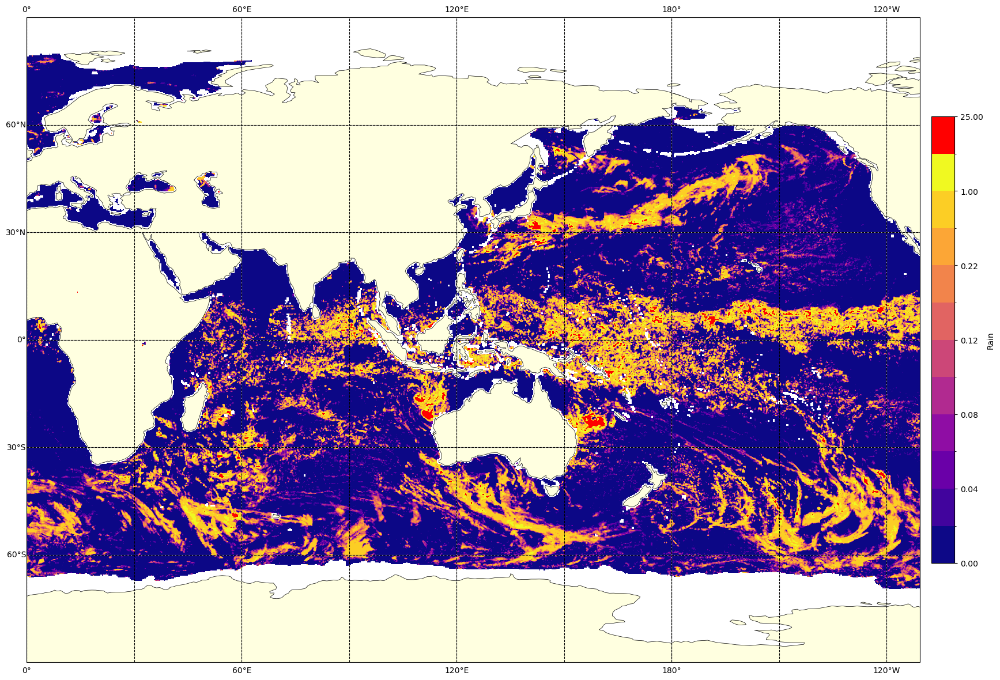

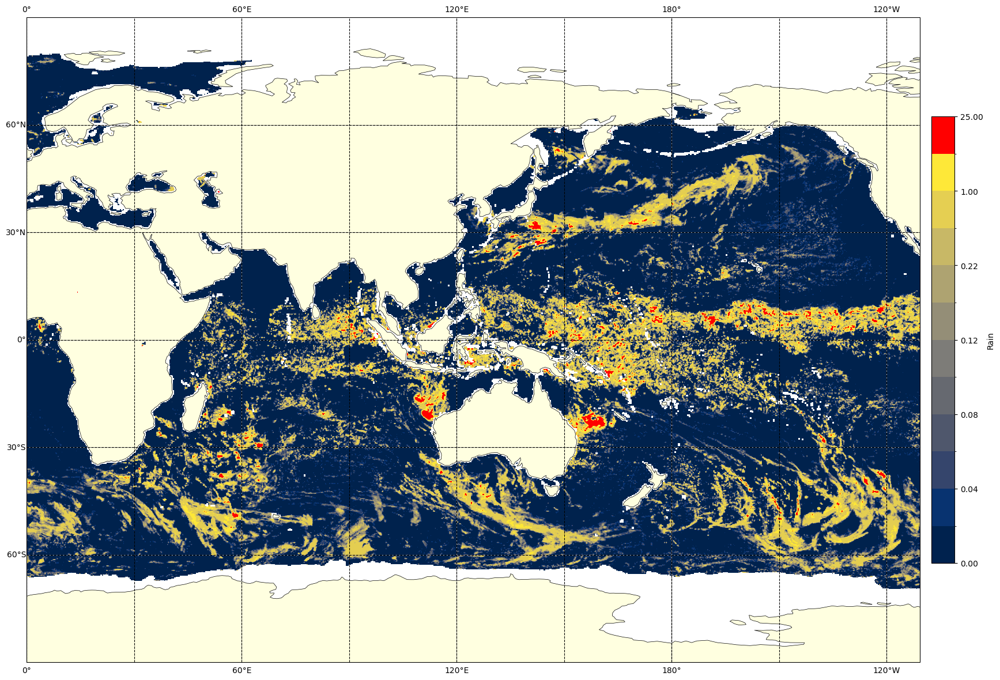

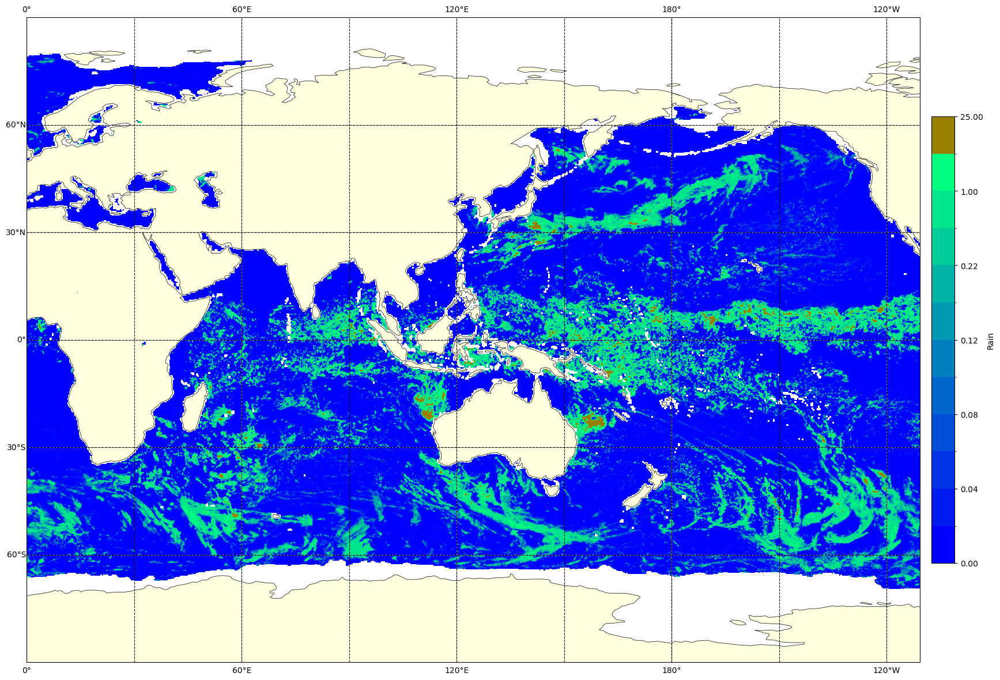

In [53]:
for i in range(0, len(colormaps)):
    color = colormaps[i]
    end = ends[i]
    get_color_plot_discrete(rain,color,extent,end,bins)

# Animations

We now proceed to the code to make animations. We have made 6 animations, as follows - 

1. Viridis Discrete
2. Cividis Discrete
3. Plasma Discrete
4. Winter Discrete
5. Viridis Continuous
6. Viridis Logarithmic

The code for the same is available below.

In [54]:
def get_color_plot_discrete_video(rain, ax, cax, cmap, norm, extent):

    rain_masked = ma.masked_where(rain == bad_value, rain)

    im = ax.imshow(rain_masked, cmap=cmap, extent=(-180, 180, -90, 90), origin='lower', transform=ccrs.PlateCarree(central_longitude=180), norm=norm, animated=True)

    posn = ax.get_position()
    cax.set_position([posn.x0 + posn.width + 0.01, posn.y0, 0.02, posn.height])
    
    cbar = plt.colorbar(im, cax=cax, orientation='vertical', shrink=0.6)    
    cbar.set_label('Rain')
    
    ax.add_feature(COASTLINE, linewidth=0.5, edgecolor='black')
    ax.add_feature(LAND,facecolor='lightyellow')

    ax.gridlines(draw_labels=True)
    ax.gridlines(xlocs=range(-180, 181, 30), ylocs=range(-90, 91, 30), linestyle='--', color='k')
    ax.xaxis.set_major_formatter(LONGITUDE_FORMATTER)
    ax.yaxis.set_major_formatter(LATITUDE_FORMATTER)
    ax.set_extent([0,extent,-90,90], ccrs.PlateCarree())

    return im

In [55]:
def get_color_plot_logarithmic_video(rain, ax, cax, cmap, norm, extent):

    offset = 1e-10
    mask = (rain == bad_value)
    rain_masked = np.ma.masked_array(np.where(mask, 0, rain + offset), mask)

    im = ax.imshow(rain_masked, cmap=cmap, extent=(-180, 180, -90, 90), origin='lower', transform=ccrs.PlateCarree(central_longitude=180), norm=norm, animated=True, interpolation='nearest')

    posn = ax.get_position()
    cax.set_position([posn.x0 + posn.width + 0.01, posn.y0, 0.02, posn.height])
    
    cbar = plt.colorbar(im, cax=cax, orientation='vertical', shrink=0.6)    
    cbar.set_label('Rain')
    
    ax.add_feature(COASTLINE, linewidth=0.5, edgecolor='black')
    ax.add_feature(LAND,facecolor='lightyellow')

    ax.gridlines(draw_labels=True)
    ax.gridlines(xlocs=range(-180, 181, 30), ylocs=range(-90, 91, 30), linestyle='--', color='k')
    ax.xaxis.set_major_formatter(LONGITUDE_FORMATTER)
    ax.yaxis.set_major_formatter(LATITUDE_FORMATTER)
    ax.set_extent([0,extent,-90,90], ccrs.PlateCarree())

    return im

In [56]:
def get_color_plot_continuous_video(rain, ax, cax, cmap, extent, vmin, vmax):

    rain_masked = ma.masked_where(rain == bad_value, rain)

    im = ax.imshow(rain_masked, cmap=cmap, extent=(-180, 180, -90, 90), origin='lower', transform=ccrs.PlateCarree(central_longitude=180), animated=True, vmin=vmin, vmax=vmax)

    posn = ax.get_position()
    cax.set_position([posn.x0 + posn.width + 0.01, posn.y0, 0.02, posn.height])
    
    cbar = plt.colorbar(im, cax=cax, orientation='vertical', shrink=0.6)    
    cbar.set_label('Rain')
    
    ax.add_feature(COASTLINE, linewidth=0.5, edgecolor='black')
    ax.add_feature(LAND,facecolor='lightyellow')

    ax.gridlines(draw_labels=True)
    ax.gridlines(xlocs=range(-180, 181, 30), ylocs=range(-90, 91, 30), linestyle='--', color='k')
    ax.xaxis.set_major_formatter(LONGITUDE_FORMATTER)
    ax.yaxis.set_major_formatter(LATITUDE_FORMATTER)
    ax.set_extent([0,extent,-90,90], ccrs.PlateCarree())

    return im

In [57]:
def make_video_discrete(datasets, colormap, extent, end, scale):

    fig = plt.figure(figsize=(20, 15))
    ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree(central_longitude=180))

    cax = fig.add_axes([0,0,0.1,0.1])
    
    norm = mcolors.BoundaryNorm(scale, len(scale)-1)

    cmap = mpl.colormaps[colormap].resampled(len(scale)-2)
    colors = cmap(np.linspace(0,1,len(scale)-2))
    colors = np.append(colors, end, axis=0)
    cmap = mcolors.ListedColormap(colors)

    ims = []

    for i in range(len(datasets)):
        im = get_color_plot_discrete_video(datasets[i], ax, cax, cmap, norm, extent)
        ims.append([im])

    animation = ArtistAnimation(fig, ims, interval=50, repeat_delay=1000, blit=False)

    plt.show()

    writer = FFMpegWriter(fps=1, metadata=dict(artist='Me'), bitrate=1800)
    animation.save(colormap+"_disc.mp4", writer=writer)

In [58]:
def make_video_logarithmic(datasets, colormap, extent):

    fig = plt.figure(figsize=(20, 15))
    ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree(central_longitude=180))

    cax = fig.add_axes([0,0,0.1,0.1])
    norm = mcolors.LogNorm()

    ims = []

    for i in range(len(datasets)):
        im = get_color_plot_logarithmic_video(datasets[i], ax, cax, colormap, norm, extent)
        ims.append([im])

    animation = ArtistAnimation(fig, ims, interval=50, repeat_delay=1000, blit=False)

    plt.show()

    writer = FFMpegWriter(fps=1, metadata=dict(artist='Me'), bitrate=1800)
    animation.save(colormap+"_log.mp4", writer=writer)

In [59]:
def make_video_continuous(datasets, colormap, extent, vmin, vmax):

    fig = plt.figure(figsize=(20, 15))
    ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree(central_longitude=180))

    cax = fig.add_axes([0,0,0.1,0.1])

    ims = []

    for i in range(len(datasets)):
        im = get_color_plot_continuous_video(datasets[i], ax, cax, colormap, extent, vmin, vmax)
        ims.append([im])

    animation = ArtistAnimation(fig, ims, interval=50, repeat_delay=1000, blit=False)

    plt.show()

    writer = FFMpegWriter(fps=1, metadata=dict(artist='Me'), bitrate=1800)
    animation.save(colormap+"_cont.mp4", writer=writer)

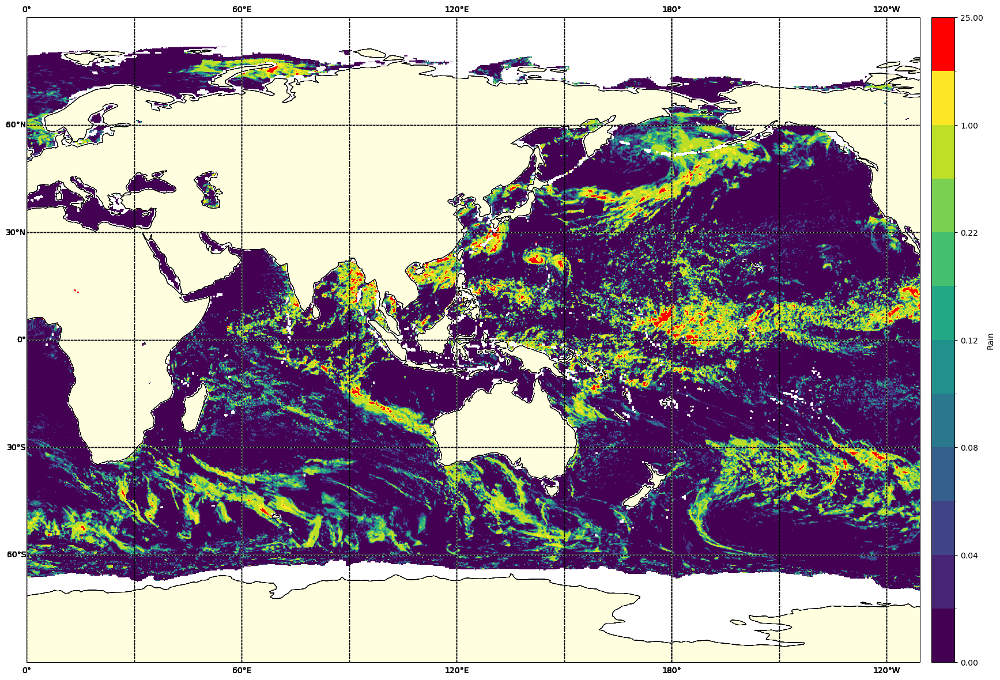

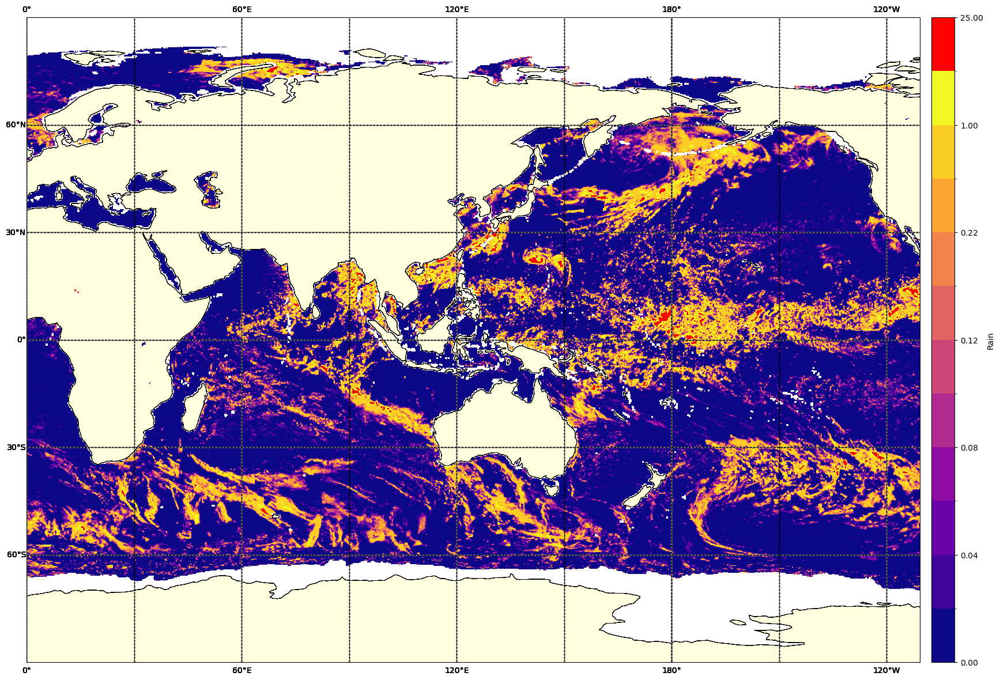

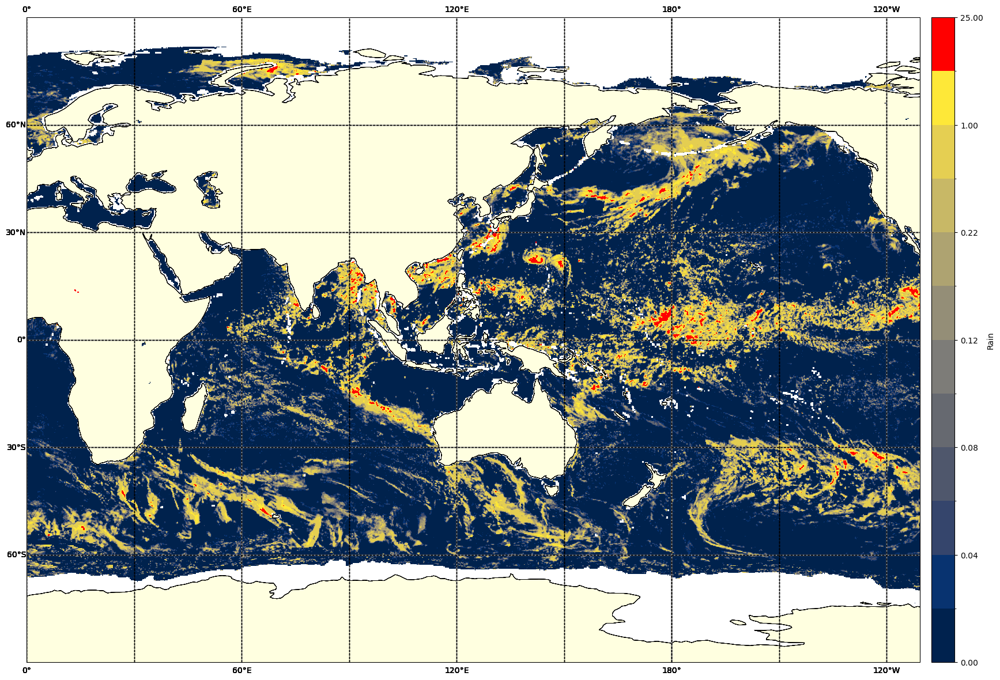

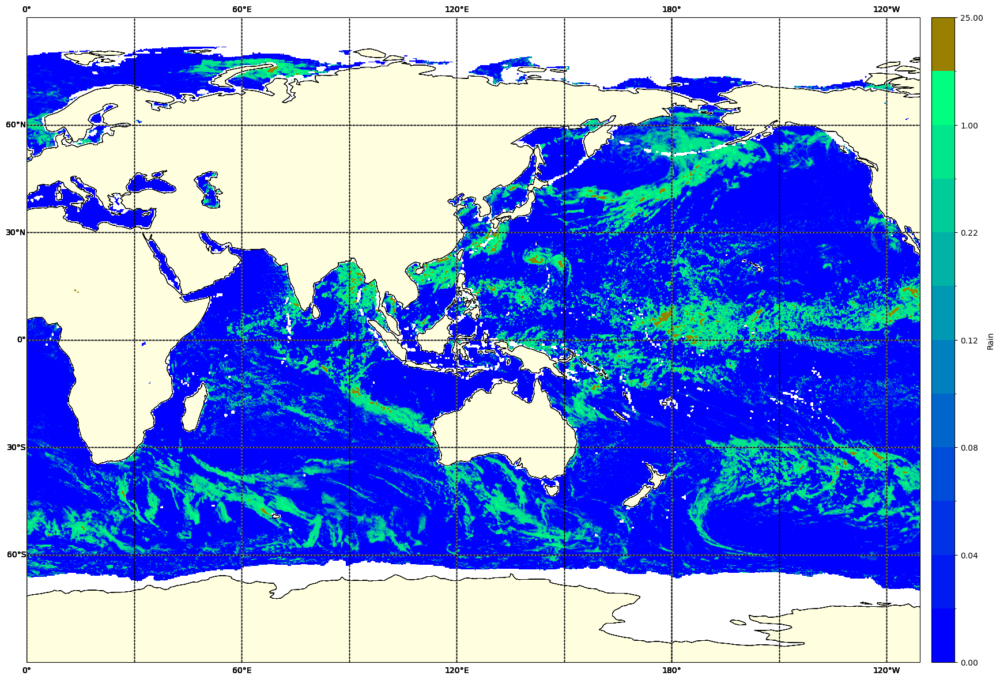

In [60]:
for i in range(len(colormaps)):
    color = colormaps[i]
    end = ends[i]
    make_video_discrete(datasets, color, extent, end, bins)

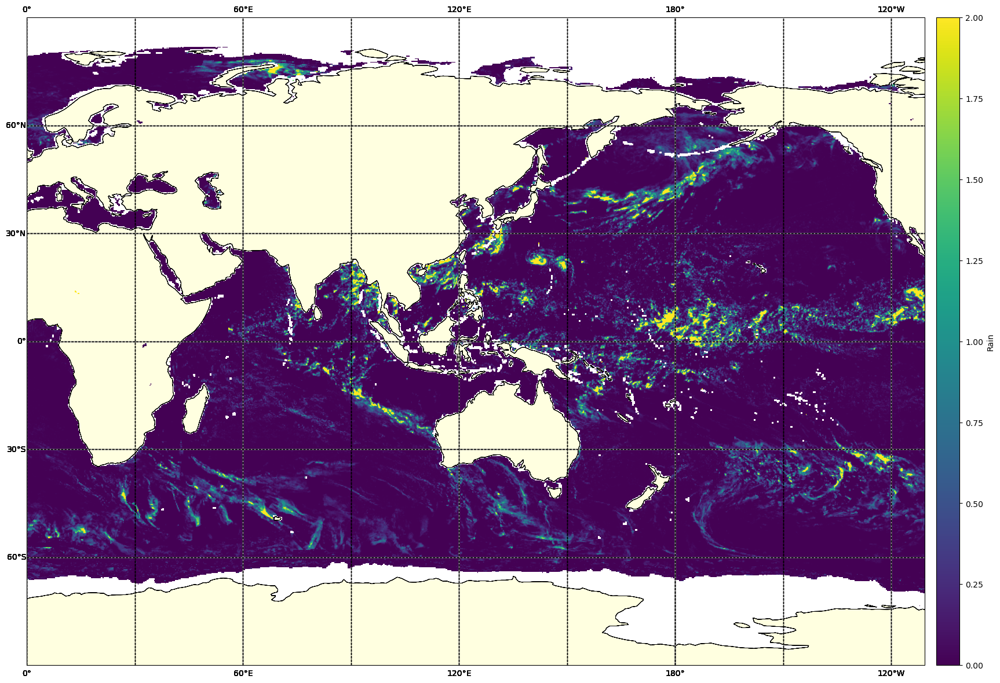

In [61]:
make_video_continuous(datasets, 'viridis', extent, 0, 2)

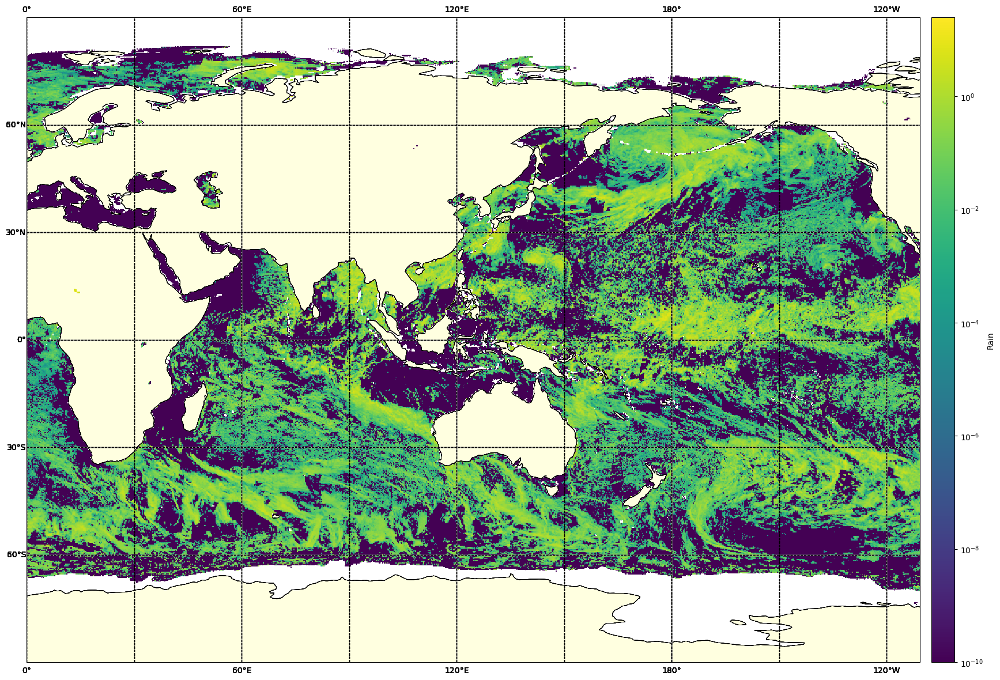

In [62]:
make_video_logarithmic(datasets, 'viridis', extent)